In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
ds = pd.read_csv('Restaurant Dataset.csv')

In [3]:
ds.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [5]:
ds.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [6]:
ds.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

**Determine the top three most common cuisines in the dataset**

In [7]:
ds['Cuisines'].value_counts().head(3)

Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64

**Calculate the percentage of restaurants that serve each of the top cuisines**

In [8]:
(ds['Cuisines'].value_counts().head(3)/len(ds))*100

Cuisines
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: count, dtype: float64

**Identify the city with the highest number of restaurants in the dataset**

In [9]:
ds['City'].value_counts().idxmax()

'New Delhi'

**Calculate the average rating for restaurants in each city**

In [10]:
ds.groupby('City')['Aggregate rating'].mean()

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

**Determine the city with the highest average rating**

In [11]:
ds.groupby('City')['Aggregate rating'].mean().idxmax()

'Inner City'

**Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants**

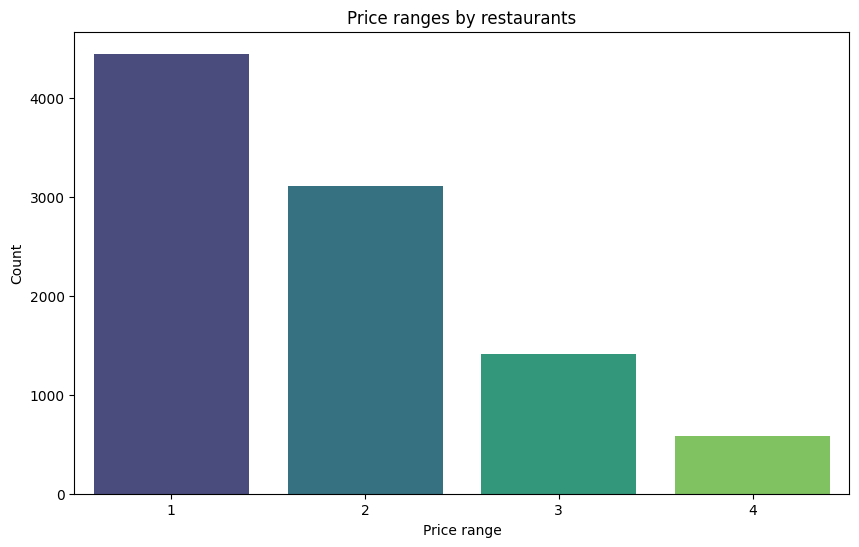

In [12]:
plt.figure(figsize=(10,6))
sns.countplot(x = 'Price range',data = ds,palette='viridis')
plt.title('Price ranges by restaurants')
plt.xlabel('Price range')
plt.ylabel('Count')
plt.show()

**Calculate the percentage of restaurants in each price range category**

In [13]:
ds['Price range'].value_counts(normalize=True)*100

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: proportion, dtype: float64

**Determine the percentage of restaurants that offer online delivery**

In [14]:
ds['Has Online delivery'].value_counts(normalize=True)*100

Has Online delivery
No     74.337766
Yes    25.662234
Name: proportion, dtype: float64

**Compare the average ratings of restaurants with and without online delivery**

In [15]:
ds.groupby('Has Online delivery')['Aggregate rating'].mean()

Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64

**Analyze the distribution of aggregate ratings and determine the most common rating range.**

<function matplotlib.pyplot.show(close=None, block=None)>

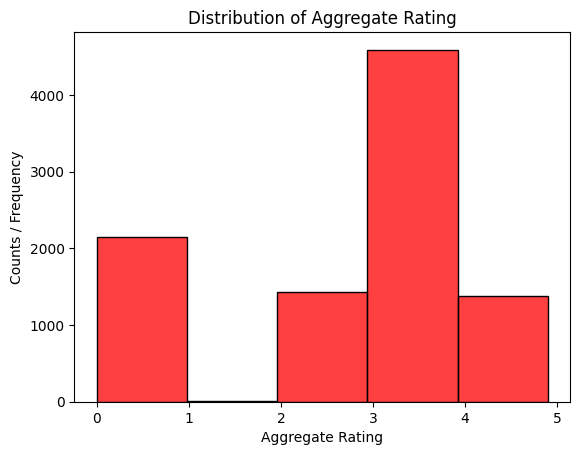

In [16]:
sns.histplot(ds['Aggregate rating'],bins = 5,color = 'red')
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Counts / Frequency')
plt.show

In [17]:
print(ds['Aggregate rating'].value_counts().idxmax())
print(ds['Aggregate rating'].value_counts().max())

0.0
2148


**Calculate the average number of votes received by restaurants**

In [18]:
ds['Votes'].mean()

156.909747670401

**Identify the most common combinations of cuisines in the dataset**

In [19]:
ds['Cuisines'].value_counts()

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [20]:
ds['Cuisines'].str.split(', ').explode().value_counts().idxmax()

'North Indian'

**Determine if certain cuisine combinations tend to have higher ratings**

In [21]:
ds['Combined Cuisines'] = ds['Cuisines'].str.split(', ')
ds.explode('Combined Cuisines').groupby('Combined Cuisines')['Aggregate rating'].mean()

Combined Cuisines
Afghani          1.971429
African          3.525000
American         3.661538
Andhra           3.870000
Arabian          3.385714
                   ...   
Turkish Pizza    4.325000
Vegetarian       4.073913
Vietnamese       3.923810
Western          4.140000
World Cuisine    4.300000
Name: Aggregate rating, Length: 145, dtype: float64

In [22]:
print(ds.groupby(['Cuisines'])['Aggregate rating'].mean().reset_index())

                                       Cuisines  Aggregate rating
0                                       Afghani             0.725
1                     Afghani, Mughlai, Chinese             0.000
2                         Afghani, North Indian             0.000
3     Afghani, North Indian, Pakistani, Arabian             0.000
4                                       African             4.700
...                                         ...               ...
1820                       Western, Asian, Cafe             4.200
1821                 Western, Fusion, Fast Food             3.200
1822                              World Cuisine             4.900
1823            World Cuisine, Mexican, Italian             4.400
1824            World Cuisine, Patisserie, Cafe             4.200

[1825 rows x 2 columns]


In [23]:
ds.groupby(['Cuisines'])['Aggregate rating'].mean().reset_index().max()

Cuisines            World Cuisine, Patisserie, Cafe
Aggregate rating                                4.9
dtype: object

**Plot the locations of restaurants on a map using longitude and latitude coordinates**

In [24]:
figure = px.scatter_geo(ds,
                     lat ='Latitude',
                     lon = 'Longitude',
                     color = 'Restaurant Name',
                     hover_name = 'Restaurant Name',
                     title = 'Restaurant locations')
figure.show()

**Identify any patterns or clusters of restaurants in specific area**

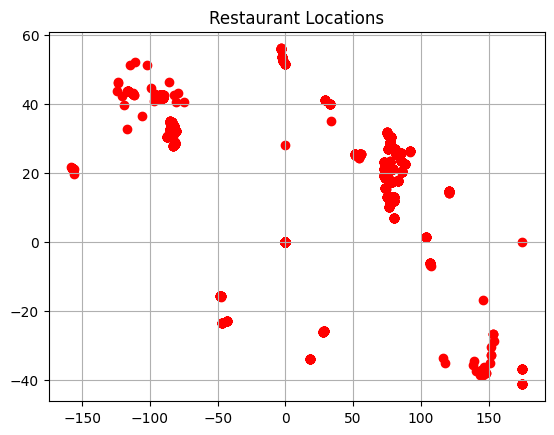

In [25]:
plt.scatter(ds['Longitude'],ds['Latitude'],color='red')
plt.title('Restaurant Locations')
plt.grid(True)
plt.show()

**Identify if there are any restaurant chains present in the dataset**

In [26]:
chains = ds['Restaurant Name'].value_counts()
chains[chains > 1]

Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64

**Analyze the ratings and popularity of different restaurant chains**

In [27]:
ds['Name'] = ds['Restaurant Name']
new_df = pd.DataFrame({
    'Average Rating': ds.groupby('Name')['Aggregate rating'].mean(),
    'Total Votes': ds.groupby('Name')['Votes'].sum()})
new_df.sort_values(by='Average Rating', ascending=False)

,Average Rating,Total Votes
Name,,
Restaurant Mosaic @ The Orient,4.9,85
Ministry of Crab,4.9,203
Miann,4.9,281
Shorts Burger and Shine,4.9,820
Milse,4.9,754
...,...,...
Cafe Corner,0.0,3
Pheva Tandooris,0.0,0
Pick & Carry,0.0,2
